In [1]:
!nvidia-smi

Mon Sep  2 10:54:39 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   63C    P8              14W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [3]:
# Pip install method (recommended)

!pip install ultralytics==8.0.196

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 32.8/78.2 GB disk)


In [4]:
from ultralytics import YOLO

from IPython.display import display, Image

In [5]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

/content/datasets


### Download Dataset from roboflow

In [6]:
!pip install roboflow --quiet
from roboflow import Roboflow

# Initialize Roboflow and download the dataset
rf = Roboflow(api_key="WEkcZ9PXJlw9vr6JD4Ap")
project = rf.workspace("detect-people-talking-on-the-phone").project("detect-people-talking-phone")
version = project.version(3)
dataset = version.download("yolov8")

# The dataset is now downloaded in a directory structure compatible with YOLOv8.


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 4.7 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Detect-people-talking-phone-3 in yolov8:: 100%|██████████| 5432/5432 [00:01<00:00, 3725.59it/s]


### Fine Tune Model

In [7]:
%cd {HOME}

/content


In [8]:
# Load a pretrained YOLO model (recommended for training)
model = YOLO("yolov8n.pt")

100%|██████████| 6.23M/6.23M [00:00<00:00, 122MB/s]
You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


In [9]:
model.train(task='detect',
            data='/content/datasets/Detect-people-talking-phone-3/data.yaml',
            epochs=15, imgsz=800,
            plots=True,
            mode='train')

New https://pypi.org/project/ultralytics/8.2.86 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/datasets/Detect-people-talking-phone-3/data.yaml, epochs=15, patience=50, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visu

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7919831373a0>
fitness: 0.31386479046077626
keys: ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']
maps: array([    0.31641,      0.2546])
names: {0: 'call', 1: 'nocall'}
plot: True
results_dict: {'metrics/precision(B)': 0.6279566939815386, 'metrics/recall(B)': 0.5458883607812874, 'metrics/mAP50(B)': 0.5691049860005427, 'metrics/mAP50-95(B)': 0.28550476873413555, 'fitness': 0.31386479046077626}
save_dir: PosixPath('runs/detect/train')
speed: {'preprocess': 0.3694874899727958, 'inference': 3.8201649983723955, 'loss': 0.0007334209623790923, 'postprocess': 2.942484901064918}

### Confusion Matrix

/content


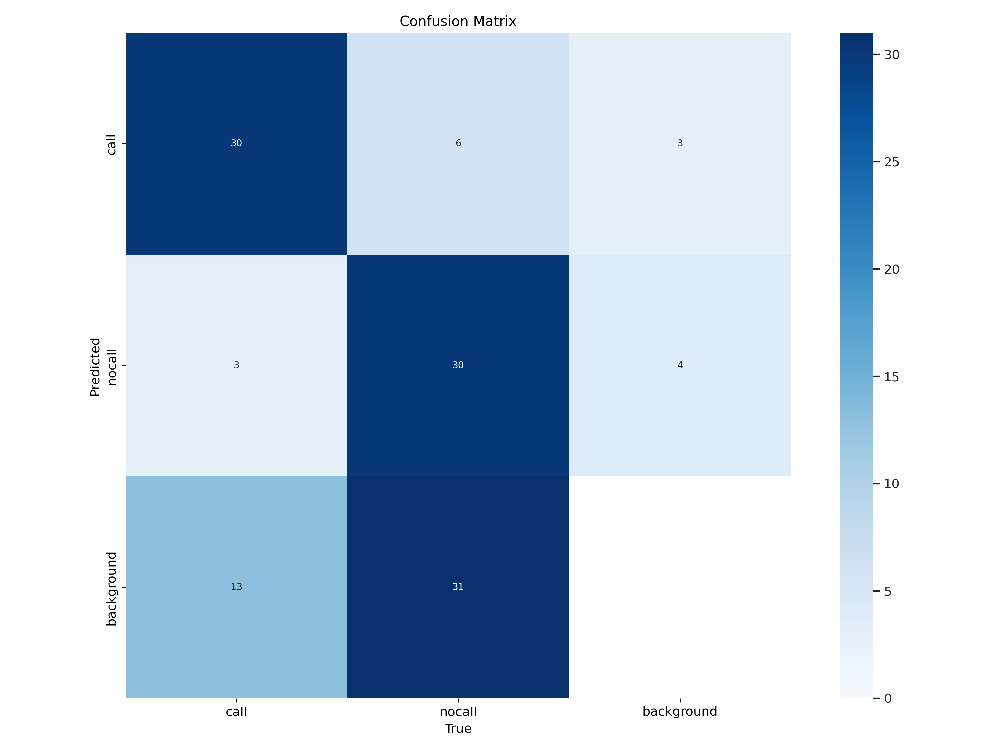

In [10]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=600)

### Results

/content


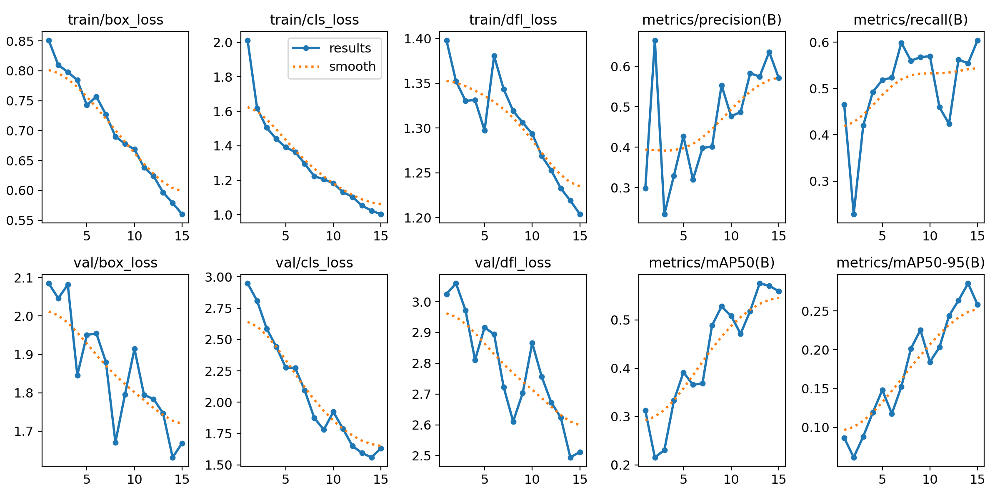

In [11]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/results.png', width=600)

/content


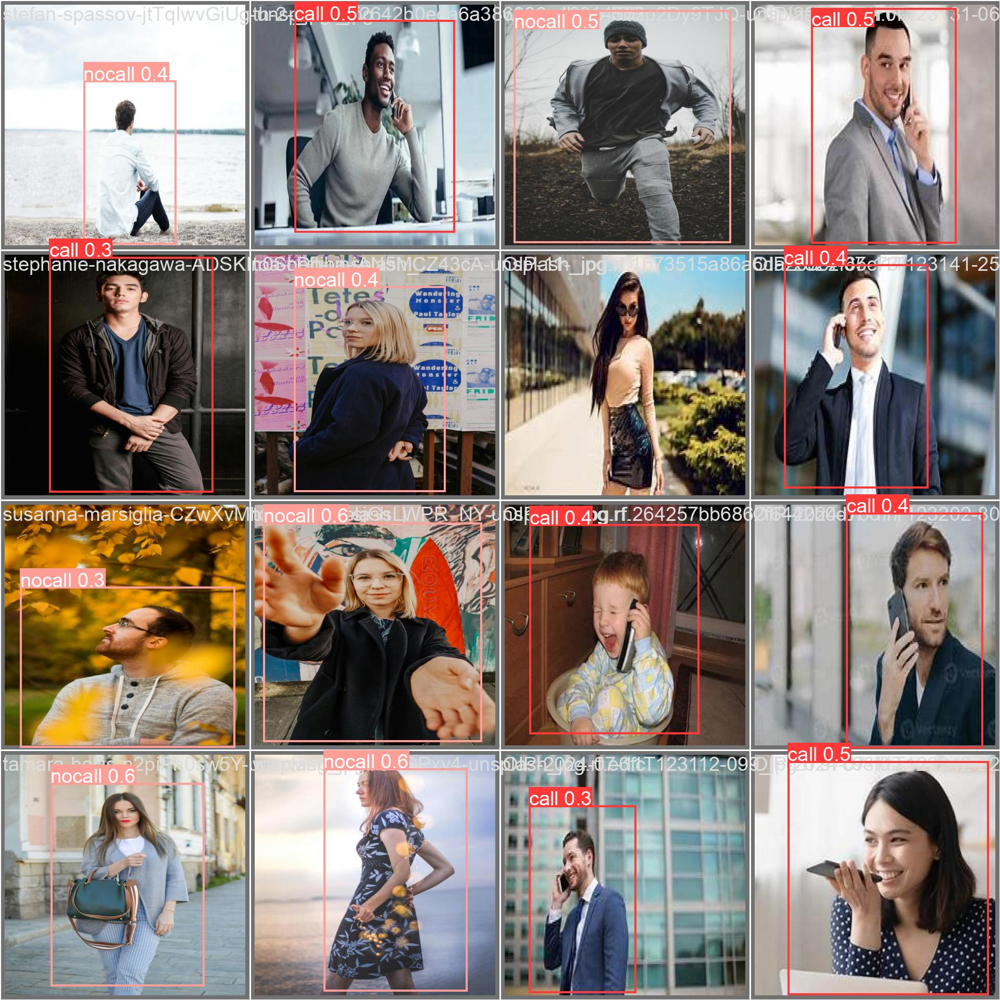

In [12]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch0_pred.jpg', width=600)

#### Validate Custom Model

In [13]:
%cd {HOME}

/content


In [14]:
model.val(
    task='detect',
    data='/content/datasets/Detect-people-talking-phone-3/data.yaml',
    imgsz=800,
    mode='val',
    plots=True,
    model='/content/runs/detect/train/weights/best.pt'
)

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3006038 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/datasets/Detect-people-talking-phone-3/valid/labels.cache... 105 images, 9 backgrounds, 0 corrupt: 100%|██████████| 105/105 [00:00<?, ?it/s]
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:06<00:00,  1.12it/s]
                   all        105        113      0.636      0.554       0.57      0.284
                  call        105         46      0.598      0.646      0.622      0.314
                nocall        105         67      0.674      0.462      0.517      0.255
Speed: 2.0ms preprocess, 10.6ms inference, 0.0ms loss, 6.2ms postprocess per image
Results saved to runs/detect/val


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x798bdc8feb00>
fitness: 0.3130212056145967
keys: ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']
maps: array([    0.31434,     0.25462])
names: {0: 'call', 1: 'nocall'}
plot: True
results_dict: {'metrics/precision(B)': 0.6356183431816014, 'metrics/recall(B)': 0.5539267002538832, 'metrics/mAP50(B)': 0.5698641969692104, 'metrics/mAP50-95(B)': 0.28448309546408407, 'fitness': 0.3130212056145967}
save_dir: PosixPath('runs/detect/val')
speed: {'preprocess': 2.0002138046991256, 'inference': 10.565844036283949, 'loss': 0.0019777388799758185, 'postprocess': 6.158192952473958}

#### Inference With Custom Model

In [15]:
%cd {HOME}



/content


In [16]:
model.predict(
    task='detect',
    mode='predict',
    source='/content/datasets/Detect-people-talking-phone-3/test/images',
    model='/content/runs/detect/train/weights/best.pt',
    conf=0.25,
    save=True
)


image 1/104 /content/datasets/Detect-people-talking-phone-3/test/images/OIP-15-_jpg.rf.103a3063e84723203b56ad381c95f3c0.jpg: 800x800 1 call, 10.0ms
image 2/104 /content/datasets/Detect-people-talking-phone-3/test/images/OIP-2024-07-11T123144-389_jpg.rf.0412fdb6ba25d57f7730f1d6e1bfaaad.jpg: 800x800 1 call, 10.0ms
image 3/104 /content/datasets/Detect-people-talking-phone-3/test/images/OIP-2024-07-11T123315-419_jpg.rf.37cc90b3e2ce5eb7a9faf6aa3eb2c580.jpg: 800x800 1 nocall, 10.0ms
image 4/104 /content/datasets/Detect-people-talking-phone-3/test/images/OIP-2024-07-11T123349-867_jpg.rf.ce29c54aeedd0e3401dbe6b2262de262.jpg: 800x800 1 call, 10.0ms
image 5/104 /content/datasets/Detect-people-talking-phone-3/test/images/OIP-2024-07-11T123444-425_jpg.rf.b273f8752a1e444483a0b7d9833860d0.jpg: 800x800 1 call, 10.0ms
image 6/104 /content/datasets/Detect-people-talking-phone-3/test/images/OIP-32-_jpg.rf.7325ab1609f559eb00ae2e76576ce934.jpg: 800x800 1 call, 10.0ms
image 7/104 /content/datasets/Detect-

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'call', 1: 'nocall'}
 orig_img: array([[[197, 164, 101],
         [197, 164, 101],
         [197, 164, 101],
         ...,
         [193, 139,  52],
         [193, 139,  52],
         [193, 139,  52]],
 
        [[197, 164, 101],
         [197, 164, 101],
         [197, 164, 101],
         ...,
         [193, 139,  52],
         [193, 139,  52],
         [193, 139,  52]],
 
        [[198, 165, 102],
         [198, 165, 102],
         [198, 165, 102],
         ...,
         [193, 139,  52],
         [193, 139,  52],
         [193, 139,  52]],
 
        ...,
 
        [[194, 160, 131],
         [194, 160, 131],
         [194, 160, 131],
         ...,
         [178, 157, 135],
         [179, 158, 136],
         [179, 158, 136]],
 
        [[195, 159, 129],
         [195, 159, 129],
         [194, 158, 128],
         ...,
         [164, 146

#### Look at Few results

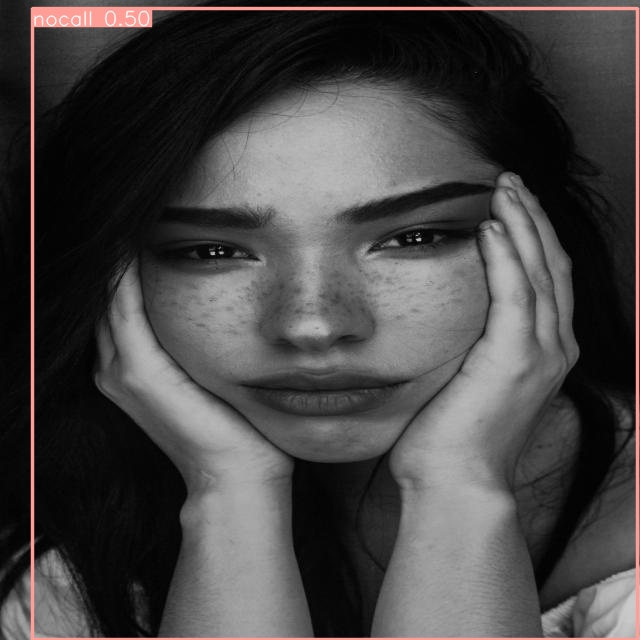

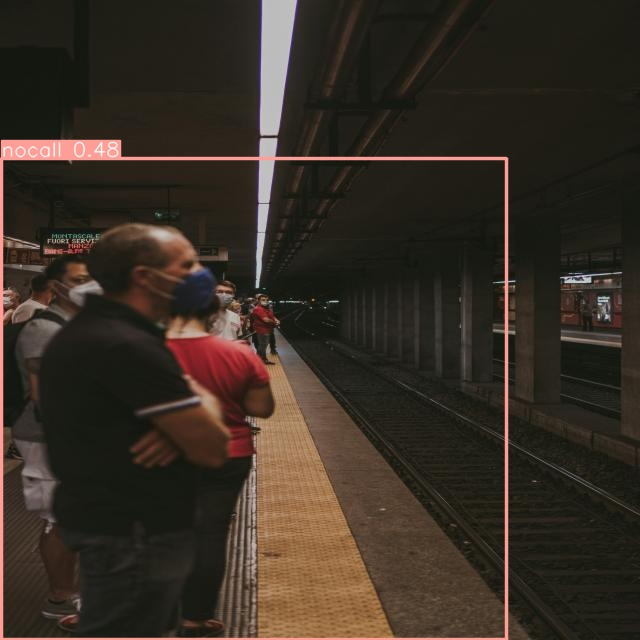

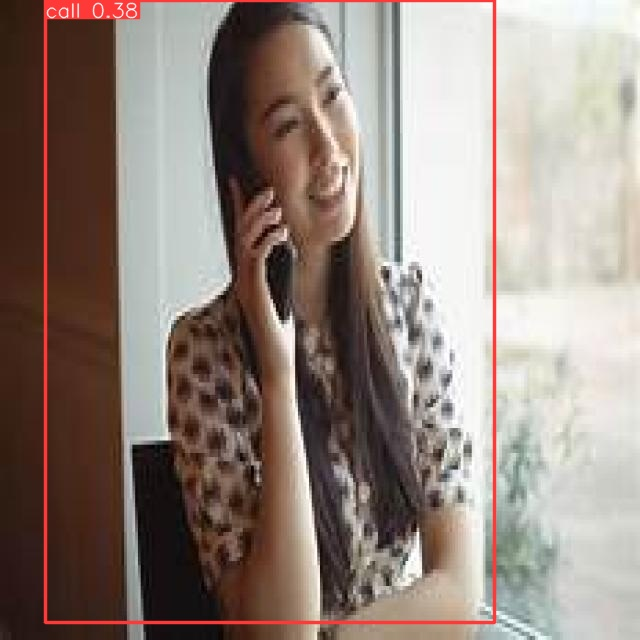

In [17]:
import glob
from IPython.display import Image, display

# Define the base path where the folders are located
base_path = '/content/runs/detect/'

# List all directories that start with 'predict' in the base path
subfolders = [os.path.join(base_path, d) for d in os.listdir(base_path)
              if os.path.isdir(os.path.join(base_path, d)) and d.startswith('predict')]

# Find the latest folder by modification time
latest_folder = max(subfolders, key=os.path.getmtime)

image_paths = glob.glob(f'{latest_folder}/*.jpg')[:3]

# Display each image
for image_path in image_paths:
    display(Image(filename=image_path, width=600))
    print("\n")

Inference in video

In [18]:
model.predict(
    task='detect',
    mode='predict',
    source='/content/CELL PHONE CRASHING at a SOCCER GAME!.mp4',
    save=True,
    model='/content/runs/detect/train/weights/best.pt',
    conf=0.25
)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (1/3593) /content/CELL PHONE CRASHING at a SOCCER GAME!.mp4: 480x800 (no detections), 60.6ms
video 1/1 (2/3593) /content/CELL PHONE CRASHING at a SOCCER GAME!.mp4: 480x800 (no detections), 8.0ms
video 1/1 (3/3593) /content/CELL PHONE CRASHING at a SOCCER GAME!.mp4: 480x800 (no detections), 8.6ms
video 1/1 (4/3593) /content/CELL PHONE CRASHING at a SOCCER GAME!.mp4: 480x800 (no detections), 7.9ms
video 1/1 (5/3593) /content/CELL PHONE CRASHING

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'call', 1: 'nocall'}
 orig_img: array([[[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        ...,
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
   

#### Testing ON Video Youtube Video

In [14]:
model.predict(
    task='detect',
    mode='predict',
    source='/content/CELL PHONE CRASHING at the AIRPORT 2014!.mp4',
    save=True,
    model='/content/runs/detect/train/weights/best.pt',
    conf=0.25
)

Streaming output truncated to the last 5000 lines.
video 1/1 (1242/6239) /content/CELL PHONE CRASHING at the AIRPORT 2014!.mp4: 480x800 3 calls, 7.0ms
video 1/1 (1243/6239) /content/CELL PHONE CRASHING at the AIRPORT 2014!.mp4: 480x800 3 calls, 7.0ms
video 1/1 (1244/6239) /content/CELL PHONE CRASHING at the AIRPORT 2014!.mp4: 480x800 3 calls, 7.0ms
video 1/1 (1245/6239) /content/CELL PHONE CRASHING at the AIRPORT 2014!.mp4: 480x800 3 calls, 7.0ms
video 1/1 (1246/6239) /content/CELL PHONE CRASHING at the AIRPORT 2014!.mp4: 480x800 3 calls, 7.0ms
video 1/1 (1247/6239) /content/CELL PHONE CRASHING at the AIRPORT 2014!.mp4: 480x800 2 calls, 7.0ms
video 1/1 (1248/6239) /content/CELL PHONE CRASHING at the AIRPORT 2014!.mp4: 480x800 2 calls, 7.0ms
video 1/1 (1249/6239) /content/CELL PHONE CRASHING at the AIRPORT 2014!.mp4: 480x800 2 calls, 7.8ms
video 1/1 (1250/6239) /content/CELL PHONE CRASHING at the AIRPORT 2014!.mp4: 480x800 3 calls, 8.6ms
video 1/1 (1251/6239) /content/CELL PHONE CRASHIN

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'call', 1: 'nocall'}
 orig_img: array([[[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        ...,
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
   

In [15]:
model.predict(
    task='detect',
    mode='predict',
    source='/content/OPPO F9 5-minute charge, 2-hour talk.mp4',
    save=True,
    model='/content/runs/detect/train/weights/best.pt',
    conf=0.25
)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (1/1500) /content/OPPO F9 5-minute charge, 2-hour talk.mp4: 480x800 (no detections), 9.0ms
video 1/1 (2/1500) /content/OPPO F9 5-minute charge, 2-hour talk.mp4: 480x800 (no detections), 7.3ms
video 1/1 (3/1500) /content/OPPO F9 5-minute charge, 2-hour talk.mp4: 480x800 (no detections), 7.3ms
video 1/1 (4/1500) /content/OPPO F9 5-minute charge, 2-hour talk.mp4: 480x800 (no detections), 7.3ms
video 1/1 (5/1500) /content/OPPO F9 5-minute charge,

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'call', 1: 'nocall'}
 orig_img: array([[[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        ...,
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
   